In [ ]:
import spatialdata as sd
import spatialdata_io
import spatialdata_plot
import sparrow as sp
from sparrow.io._visium_hd import visium_hd
from napari_spatialdata import Interactive
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Import _rasterize_bins from ../utils/rasterize_bins.py
import sys
sys.path.append('../utils')
from rasterize_bins import _rasterize_bins


/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
2025-06-10 14:43:08,709 - sparrow.image.pixel_clustering._clustering - WARNING - 'flowsom' not installed, to use 'sp.im.flowsom', please install this library.
2

In this notebook, we are going to preprocess the 8um bin size according to the single-cell analysis pipeline.

In [2]:
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3
sc.settings.figdir = "./plots"

In [3]:
first_run = False

if first_run:
    sdata = spatialdata_io.visium_hd('../data/Visium_HD_Liver_CAW009',
                                    fullres_image_file="microscope_image/CAW009_HE_hires.tif",
                                    annotate_table_by_labels=True)
    # Write to zarr
    sdata.write('../data/Visium_HD_Liver_CAW009/Visium_HD_Liver_CAW009_zarr')
    del sdata

sdata = sd.read_zarr('../data/Visium_HD_Liver_CAW009/Visium_HD_Liver_CAW009_zarr')

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
sdata

SpatialData object, with associated Zarr store: /home/chananchidas/visium-hd/data/Visium_HD_Liver_CAW009/Visium_HD_Liver_CAW009_zarr
├── Images
│     ├── 'CAW009_full_image': DataTree[cyx] (3, 23878, 18889), (3, 11939, 9444), (3, 5969, 4722), (3, 2984, 2361), (3, 1492, 1180)
│     ├── 'CAW009_hires_image': DataArray[cyx] (3, 6000, 4747)
│     └── 'CAW009_lowres_image': DataArray[cyx] (3, 600, 475)
├── Labels
│     ├── 'CAW009_square_002um_labels': DataArray[yx] (3350, 3350)
│     ├── 'CAW009_square_008um_labels': DataArray[yx] (838, 838)
│     ├── 'CAW009_square_016um_labels': DataArray[yx] (419, 419)
│     └── 'CAW009_square_032um_labels': DataArray[yx] (210, 210)
├── Shapes
│     ├── 'CAW009_square_002um': GeoDataFrame shape: (6931516, 1) (2D shapes)
│     ├── 'CAW009_square_008um': GeoDataFrame shape: (437010, 1) (2D shapes)
│     ├── 'CAW009_square_016um': GeoDataFrame shape: (110518, 1) (2D shapes)
│     └── 'CAW009_square_032um': GeoDataFrame shape: (28319, 1) (2D shapes)
└── Tab

INFO     Rasterizing image for faster rendering.                                                                   


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09090909..1.0].


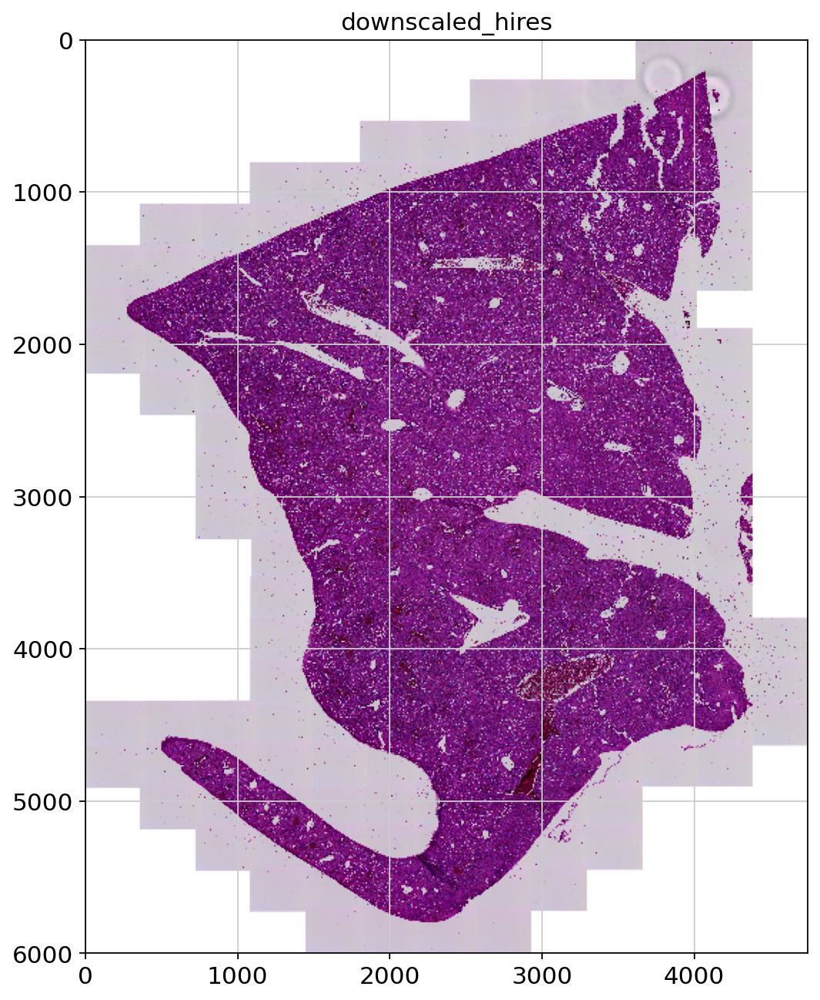

In [4]:
sdata.pl.render_images("CAW009_hires_image").pl.show(coordinate_systems="downscaled_hires")

## QC and preprocessing

We perform some basic filtering of spots based on total counts and expressed genes on the 8um bin

In [68]:
adata = sdata.tables['square_008um']
adata

AnnData object with n_obs × n_vars = 437010 × 19059
    obs: 'location_id', 'in_tissue', 'array_row', 'array_col', 'region'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [69]:
adata.var["mt"] = adata.var_names.str.startswith("Mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

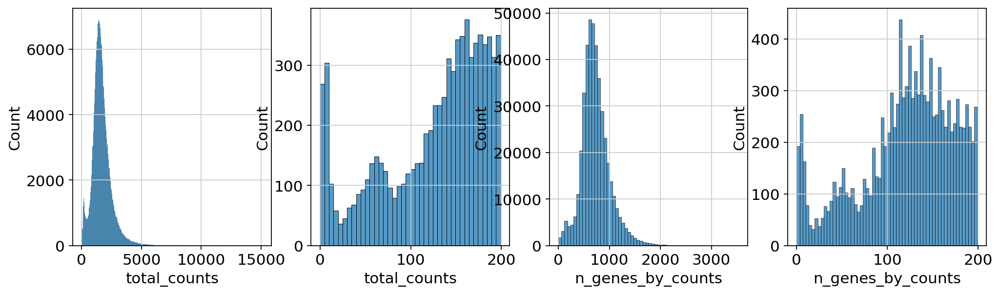

In [70]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 200],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 200],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [71]:
# sc.pp.filter_cells(adata, min_counts=50)
# sc.pp.filter_cells(adata, max_counts=4000)
adata = adata[adata.obs["pct_counts_mt"] < 20].copy()
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

#cells after MT filter: 437003
filtered out 510 genes that are detected in less than 10 cells


We proceed to normalize Visium counts data with the built-in `normalize_total` method from Scanpy, and detect highly-variable genes (for later). Note that there are alternatives for normalization (see discussion in [[Luecken19](https://www.embopress.org/doi/full/10.15252/msb.20188746)], and more recent alternatives such as [SCTransform](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1874-1) or [GLM-PCA](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1861-6)).

In [72]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


## Manifold embedding and clustering based on transcriptional similarity

To embed and cluster the manifold encoded by transcriptional similarity, we proceed as in the standard clustering tutorial.

In [73]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(
    adata, key_added="clusters", flavor="igraph", directed=False, n_iterations=2
)

computing PCA
    with n_comps=50
    finished (0:00:14)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/scipy/sparse/_index.py:145: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-06-10 10:53:39.604082: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749545619.662661    7519 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749545619.680021    7519 cuda_blas.cc:1418] Unable to register cuBLAS factory

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:06:54)
running Leiden clustering
    finished: found 13 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:23)


We plot some covariates to check if there is any particular structure in the UMAP associated with total counts and detected genes.

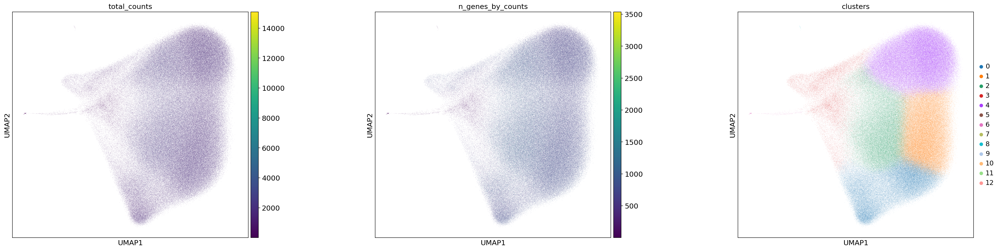

[<Axes: title={'center': 'total_counts'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'n_genes_by_counts'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'clusters'}, xlabel='UMAP1', ylabel='UMAP2'>]

In [74]:
#plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

# Save UMAP plot
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"],
           save="_8um_clusters.png", wspace=0.4, show=False)

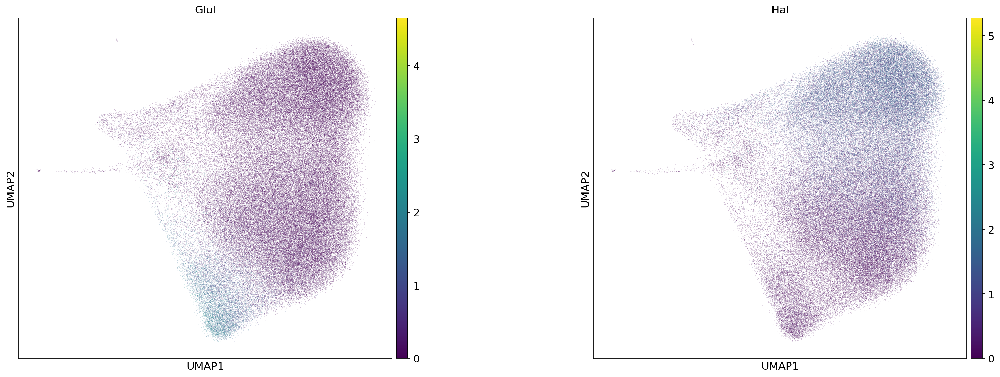

[<Axes: title={'center': 'Glul'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'Hal'}, xlabel='UMAP1', ylabel='UMAP2'>]

In [75]:
# Plot some liver zonation markers
zonation_markers = ['Glul', 'Hal']
sc.pl.umap(adata, color=zonation_markers, wspace=0.4)

# Save UMAP plot
sc.pl.umap(adata, color=zonation_markers,
           save="_8um_zonationmarkers.png", wspace=0.4, show=False)

In [32]:
# Save table as zarr file
# adata.var_names_make_unique()
# sdata['square_008um_processed'] = adata
# sdata.write_element('square_008um_processed')

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/spatialdata/_core/_elements.py:116: UserWarning: Key `square_008um_processed` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)


## Visualization in spatial coordinates

Let us now take a look at how `total_counts` and `n_genes_by_counts` behave in spatial coordinates. We will overlay the circular spots on top of the Hematoxylin and eosin stain (H&E) image provided.

In [5]:
table_layer = 'square_008um_processed'
adata = sdata.tables[table_layer]
labels_layer = "CAW009_square_008um_labels"
shapes_layer = "CAW009_square_008um"
adata

AnnData object with n_obs × n_vars = 437003 × 18549
    obs: 'location_id', 'in_tissue', 'array_row', 'array_col', 'region', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters', 'clusters_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'spatialdata_attrs', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
Clipping input data to the valid range for imshow with RGB d

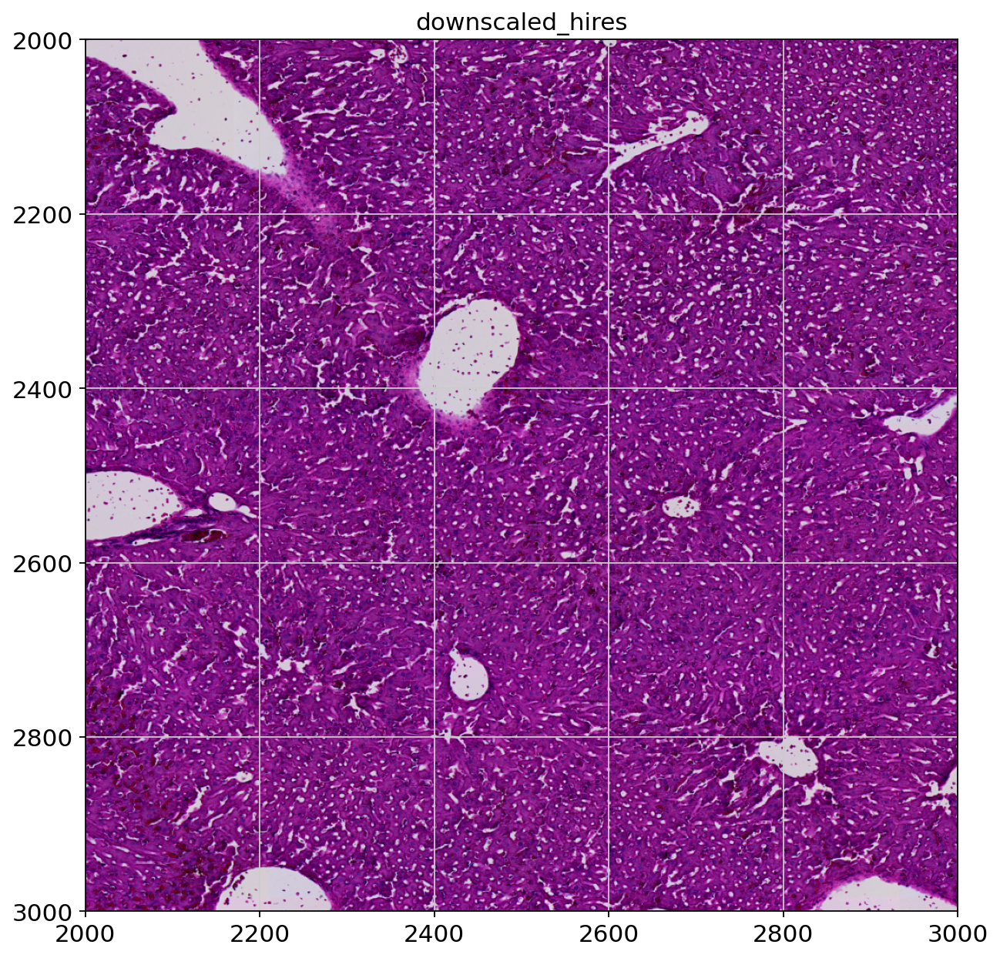

In [8]:
sdata.query.bounding_box(
    min_coordinate=[2000, 2000], max_coordinate=[3000, 3000], axes=("x", "y"), target_coordinate_system="downscaled_hires"
).pl.render_images("CAW009_hires_image").pl.show(coordinate_systems="downscaled_hires")

In [24]:
sdata["square_008um_processed"].var.index.is_unique

True

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/sit

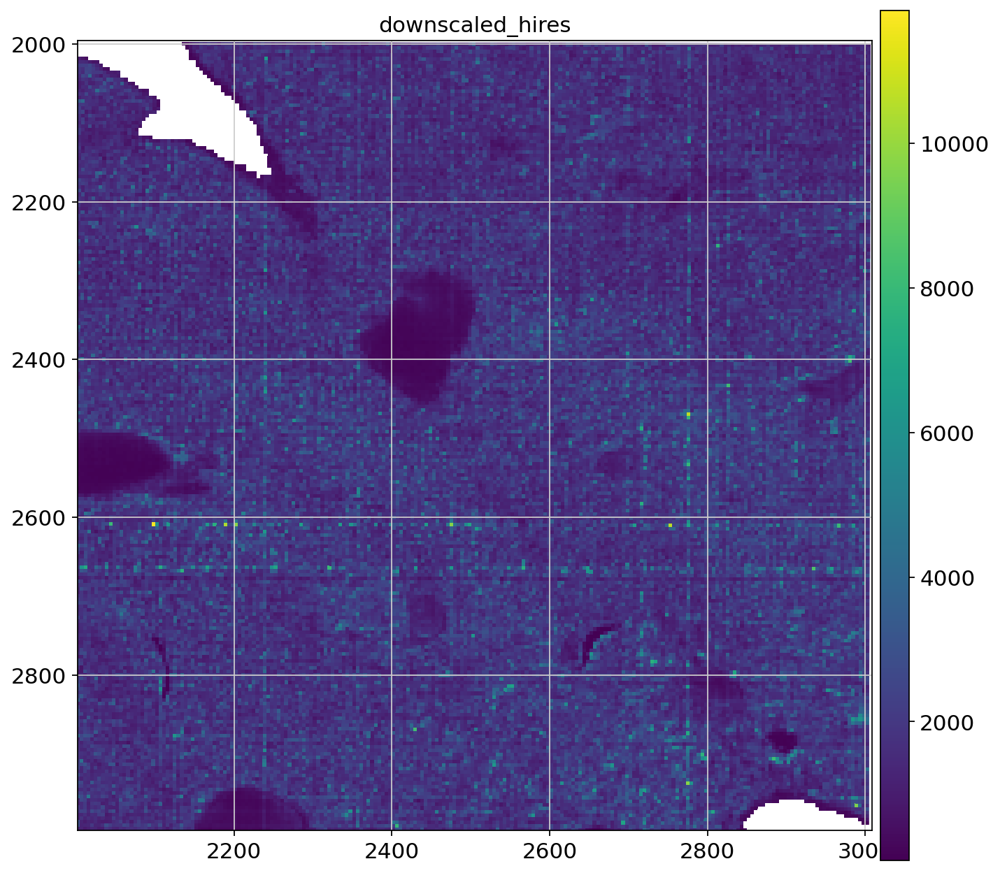

In [26]:
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name =  "total_counts"
sdata.query.bounding_box(
    min_coordinate=[2000, 2000], max_coordinate=[3000, 3000], axes=("x", "y"), target_coordinate_system="downscaled_hires"
).pl.render_labels(labels_layer, table_name=table_layer,
                   color=gene_name, method="datashader", fill_alpha=1.0).pl.show(
    coordinate_systems="downscaled_hires", ax=ax
)

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/sit

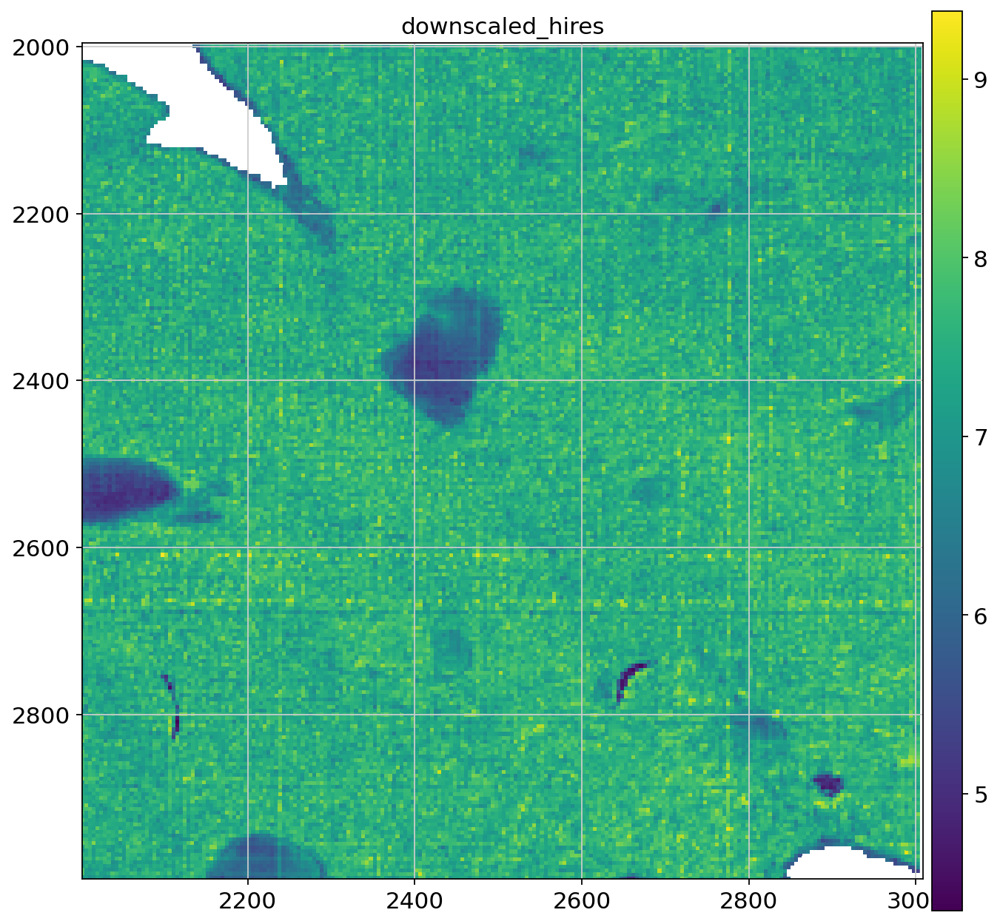

In [15]:
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name =  "log1p_total_counts"
sdata.query.bounding_box(
    min_coordinate=[2000, 2000], max_coordinate=[3000, 3000], axes=("x", "y"), target_coordinate_system="downscaled_hires"
).pl.render_labels(labels_layer, table_name=table_layer,
                   color=gene_name, method="datashader", fill_alpha=1.0).pl.show(
    coordinate_systems="downscaled_hires", ax=ax
)


/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/sit

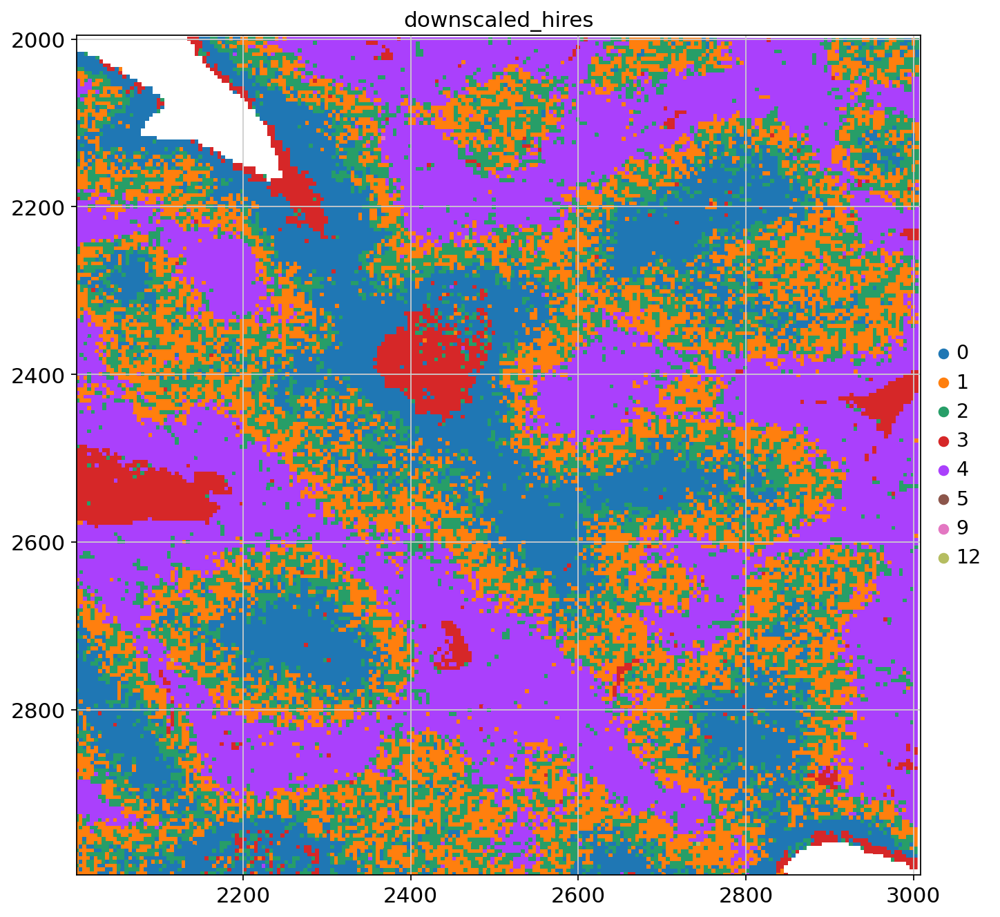

In [17]:
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name =  "clusters"
sdata.query.bounding_box(
    min_coordinate=[2000, 2000], max_coordinate=[3000, 3000], axes=("x", "y"), target_coordinate_system="downscaled_hires"
).pl.render_labels(labels_layer, table_name=table_layer,
                   color=gene_name, method="datashader", fill_alpha=1.0).pl.show(
    coordinate_systems="downscaled_hires", ax=ax
)


## Cluster marker genes

Compute marker genes and plot a heatmap with expression levels of its top 10 marker genes across clusters.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:32)
categories: 0, 1, 2, etc.
var_group_labels: 0


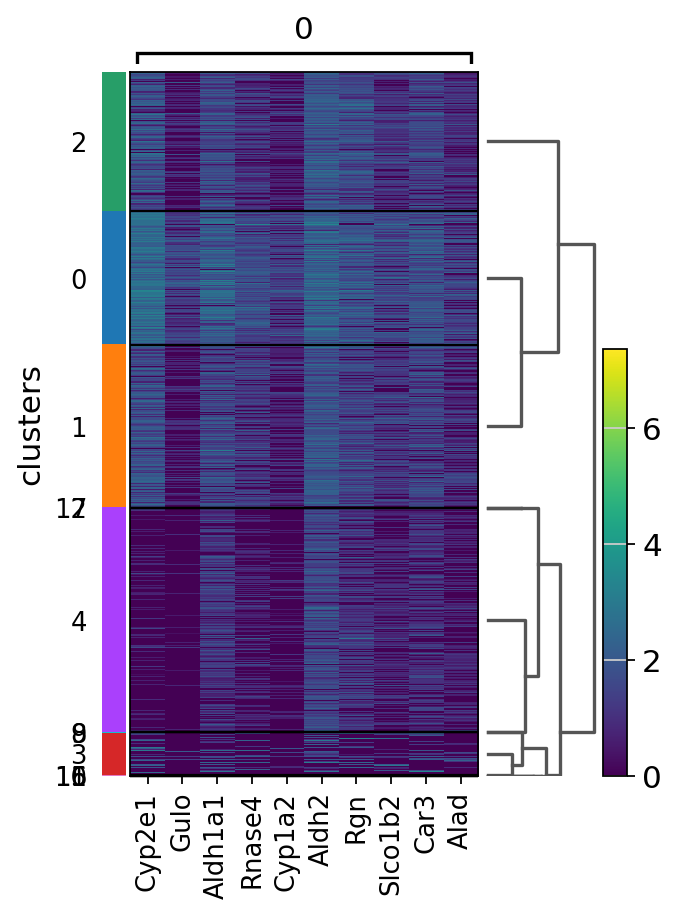

In [ ]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="0", n_genes=10, groupby="clusters")

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/sit

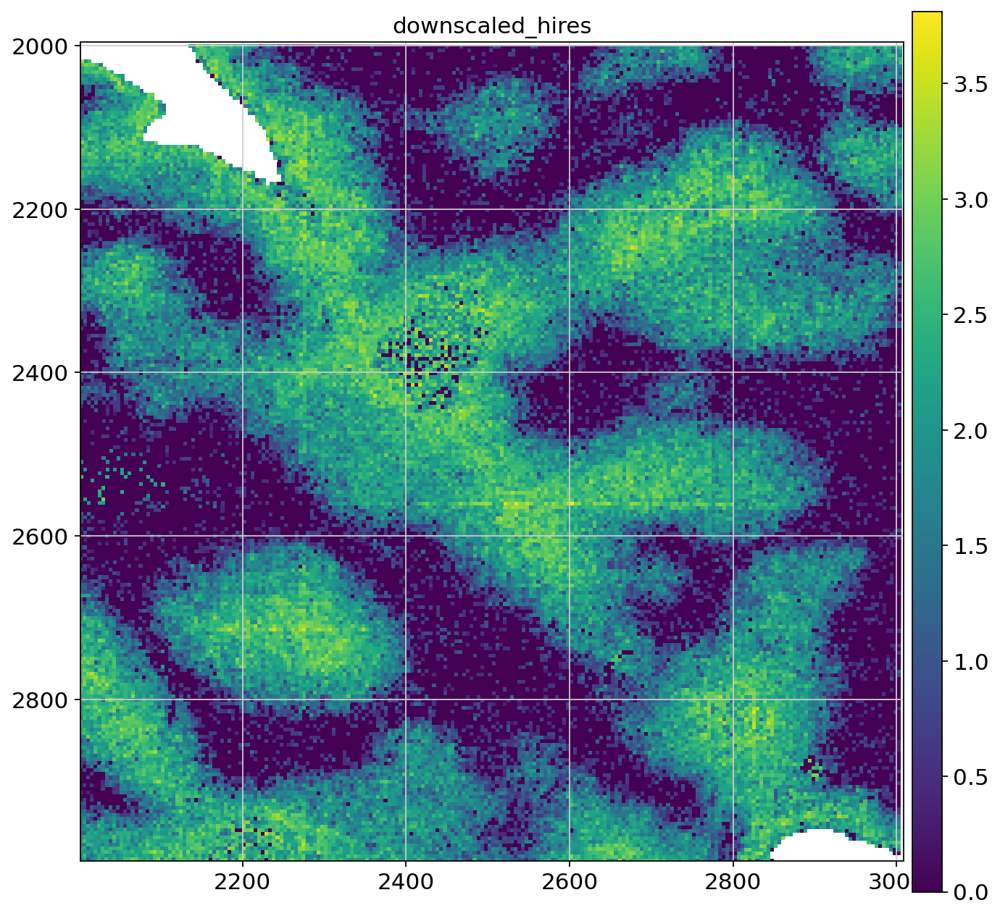

In [ ]:
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name =  "Cyp2e1"
sdata.query.bounding_box(
    min_coordinate=[2000, 2000], max_coordinate=[3000, 3000], axes=("x", "y"), target_coordinate_system="downscaled_hires"
).pl.render_labels(labels_layer, table_name=table_layer,
                   color=gene_name, method="datashader", fill_alpha=1.0).pl.show(
    coordinate_systems="downscaled_hires", ax=ax
)

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/sit

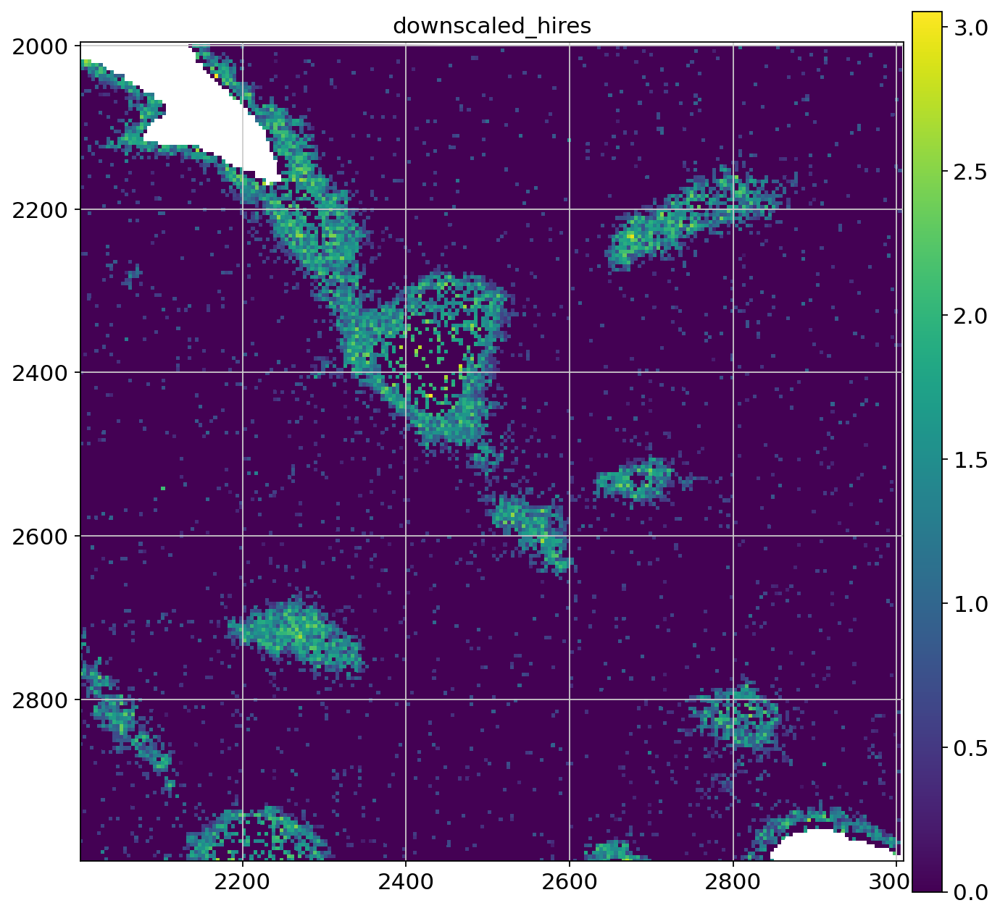

In [ ]:
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name =  "Glul"
sdata.query.bounding_box(
    min_coordinate=[2000, 2000], max_coordinate=[3000, 3000], axes=("x", "y"), target_coordinate_system="downscaled_hires"
).pl.render_labels(labels_layer, table_name=table_layer,
                   color=gene_name, method="datashader", fill_alpha=1.0).pl.show(
    coordinate_systems="downscaled_hires", ax=ax
)

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/sit

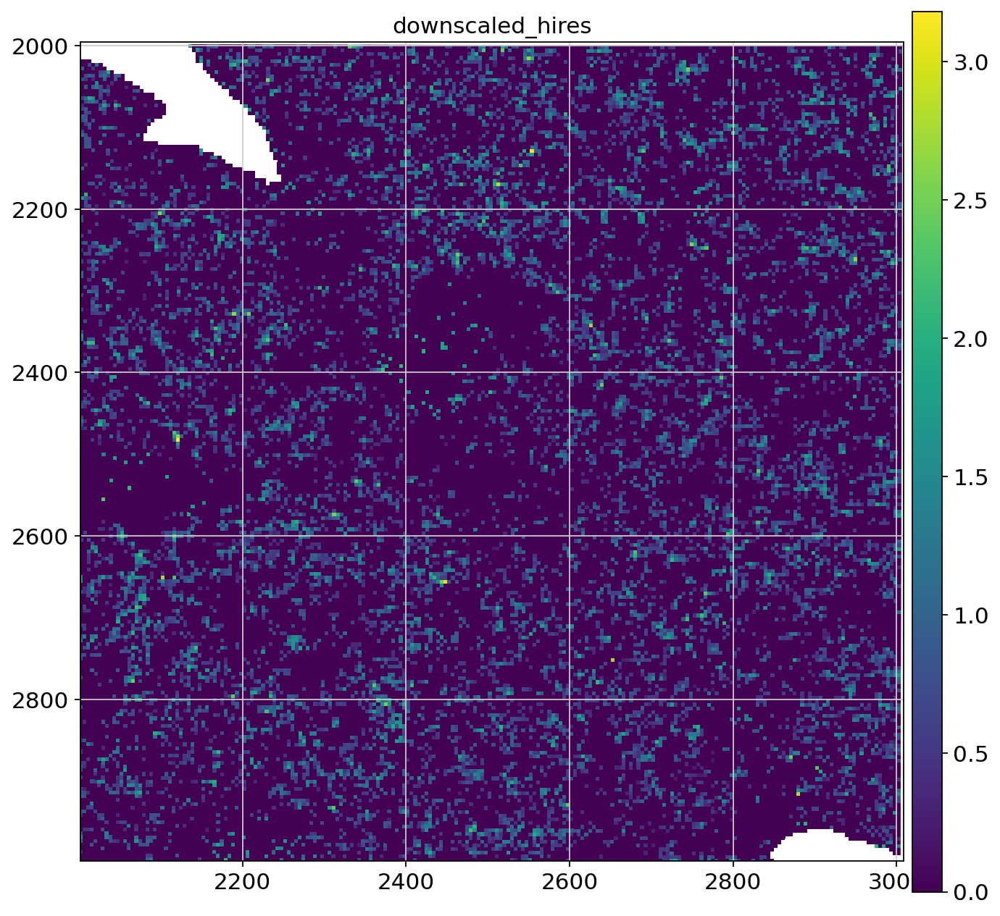

In [ ]:
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name =  "Clec4f"
sdata.query.bounding_box(
    min_coordinate=[2000, 2000], max_coordinate=[3000, 3000], axes=("x", "y"), target_coordinate_system="downscaled_hires"
).pl.render_labels(labels_layer, table_name=table_layer,
                   color=gene_name, method="datashader", fill_alpha=1.0).pl.show(
    coordinate_systems="downscaled_hires", ax=ax
)

## Cell type scoring

Let us try annotating the bins via marker gene scoring. We will do this using the MERSCOPE panel provided by the Guilliams lab.

In [ ]:
# Read in visium_hd_liver/final_MERscope_panel_Guilliams1.csv
marker_genes = pd.read_csv('../data/liver_marker_genes/final_MERscope_panel_Guilliams1.csv')

# Print the first few rows of the marker_genes dataframe
print(marker_genes.head())

# Check how many of the "Vizgen Gene" column values are in the adata.var_names
print("{} out of {} genes are in the AnnData".format(marker_genes['Vizgen Gene'].isin(adata.var_names).sum(), len(marker_genes)))

# Get value_counts of "Notes" column that starts with cellType_
print(marker_genes['Notes'][marker_genes['Notes'].str.startswith('cellType_')].value_counts())

# Only get marker genes with cellType_ in the "Notes" column that has more than 10 genes
marker_genes_subset = marker_genes[marker_genes['Notes'].str.startswith('cellType_')].copy()
marker_genes_subset = marker_genes_subset[marker_genes_subset['Notes'].map(marker_genes_subset['Notes'].value_counts()) >= 10]
print(marker_genes_subset)

  Gene Input Vizgen Gene         Ensemble ID          Transcript  \
0       NGFR        Ngfr  ENSMUSG00000000120  ENSMUST00000000122   
1       CCL2        Ccl2  ENSMUSG00000035385  ENSMUST00000000193   
2      CCL12       Ccl12  ENSMUSG00000035352  ENSMUST00000000194   
3         TH          Th  ENSMUSG00000000214  ENSMUST00000000219   
4       LHX2        Lhx2  ENSMUSG00000000247  ENSMUST00000000253   

                         Notes  Abundance  Target Regions     Type  
0     zonation_portal_stellate   0.633947             102  MERFISH  
1        partialHepatectomy_KC   1.699000              57  MERFISH  
2  partialHepatectomy_monocyte   0.084735              40  MERFISH  
3            neuron_adrenergic   0.027851              51  MERFISH  
4            cellType_stellate   0.532331              55  MERFISH  
959 out of 1000 genes are in the AnnData
Notes
cellType_stellate              35
cellType_LSEC                  33
cellType_fibroblast            32
cellType_KC                 

In [7]:
print(marker_genes['Notes'][marker_genes['Notes'].str.startswith('cellType_')].value_counts())


Notes
cellType_stellate              35
cellType_LSEC                  33
cellType_fibroblast            32
cellType_KC                    28
cellType_TCell                 27
cellType_hepatocyte            19
cellType_neutrophil            19
cellType_coreMacrophage        16
cellType_monocyte              14
cellType_basophil              13
cellType_cDC2                  12
cellType_cholangiocyte         12
cellType_cDC1                  12
cellType_LAM                   11
cellType_otherMacrophage       10
cellType_BCell                 10
cellType_DCMig                  9
cellType_pDC                    9
cellType_mesothelial            9
cellType_coreEndothelial        7
cellType_ILC1                   7
cellType_NKCell                 7
cellType_MSC                    7
cellType_coreMesenchymal        6
cellType_veins                  6
cellType_VSMC                   5
cellType_LEC                    4
cellType_HpSC                   4
cellType_monocytePatrolling     3
cellType

In [8]:
# Turn marker_gene_subset into a one-hot encoded dataframe, with cell type names in the first row, and marker genes in the columns
marker_genes_onehot = marker_genes_subset.pivot(index='Notes', columns='Vizgen Gene', values='Vizgen Gene').fillna(0)
# Turn string to 1
marker_genes_onehot = marker_genes_onehot.applymap(lambda x: 1 if x != 0 else 0)
# Remove "cellType_" from the index
marker_genes_onehot.index = marker_genes_onehot.index.str.replace('cellType_', '')
# Transpose this
marker_genes_onehot = marker_genes_onehot.T
marker_genes_onehot

# Save marker_genes_onehot to a csv
# marker_genes_onehot.to_csv('MERSCOPE_marker_genes_onehot.csv')

/tmp/ipykernel_124641/316610272.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  marker_genes_onehot = marker_genes_onehot.applymap(lambda x: 1 if x != 0 else 0)


Notes,BCell,KC,LAM,LSEC,TCell,basophil,cDC1,cDC2,cholangiocyte,coreMacrophage,fibroblast,hepatocyte,monocyte,neutrophil,otherMacrophage,stellate
Vizgen Gene,,,,,,,,,,,,,,,,
Acp5,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
Acta2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
Adgre1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
Adh4,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
Alox5,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wnt5a,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
Wwox,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
Xcl1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# We will change some AnnData properties to make it compatible with sparrow functions
# See https://github.com/saeyslab/napari-sparrow/blob/main/src/sparrow/io/_visium_hd.py
from sparrow.utils._keys import _INSTANCE_KEY, _REGION_KEY
from spatialdata.models import TableModel
from spatialdata_io._constants._constants import VisiumHDKeys

adata = sdata[table_layer]
adata.var_names_make_unique()
adata.X = adata.X.tocsc()

adata.obs.rename(
    columns={VisiumHDKeys.REGION_KEY: _REGION_KEY, VisiumHDKeys.INSTANCE_KEY: _INSTANCE_KEY}, inplace=True
)
adata.uns.pop(TableModel.ATTRS_KEY)
adata = TableModel.parse(
    adata,
    region_key=_REGION_KEY,
    region=adata.obs[_REGION_KEY].cat.categories.to_list(),
    instance_key=_INSTANCE_KEY,
)

sdata[shapes_layer].index.name = _INSTANCE_KEY

In [10]:
# Use sparrow.tb.score_genes to score the marker genes in the adata
sp.tb.score_genes(sdata, labels_layer=labels_layer, table_layer=table_layer, output_layer=table_layer+"_celltype_scores",
                       path_marker_genes=marker_genes_onehot, celltype_column='annotation', overwrite=True)

computing score 'BCell'
    finished: added
    'BCell', score of gene set (adata.obs).
    349 total control genes are used. (0:00:01)
computing score 'KC'
    finished: added
    'KC', score of gene set (adata.obs).
    599 total control genes are used. (0:00:01)
computing score 'LAM'
    finished: added
    'LAM', score of gene set (adata.obs).
    350 total control genes are used. (0:00:01)
computing score 'LSEC'
    finished: added
    'LSEC', score of gene set (adata.obs).
    597 total control genes are used. (0:00:01)
computing score 'TCell'
    finished: added
    'TCell', score of gene set (adata.obs).
    398 total control genes are used. (0:00:01)
computing score 'basophil'
    finished: added
    'basophil', score of gene set (adata.obs).
    400 total control genes are used. (0:00:01)
computing score 'cDC1'
    finished: added
    'cDC1', score of gene set (adata.obs).
    400 total control genes are used. (0:00:01)
computing score 'cDC2'
    finished: added
    'cDC2', s

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


(SpatialData object, with associated Zarr store: /home/chananchidas/visium-hd/data/Visium_HD_Liver_CAW009/Visium_HD_Liver_CAW009_zarr
 ├── Images
 │     ├── 'CAW009_full_image': DataTree[cyx] (3, 23878, 18889), (3, 11939, 9444), (3, 5969, 4722), (3, 2984, 2361), (3, 1492, 1180)
 │     ├── 'CAW009_hires_image': DataArray[cyx] (3, 6000, 4747)
 │     └── 'CAW009_lowres_image': DataArray[cyx] (3, 600, 475)
 ├── Labels
 │     ├── 'CAW009_square_002um_labels': DataArray[yx] (3350, 3350)
 │     ├── 'CAW009_square_008um_labels': DataArray[yx] (838, 838)
 │     ├── 'CAW009_square_016um_labels': DataArray[yx] (419, 419)
 │     └── 'CAW009_square_032um_labels': DataArray[yx] (210, 210)
 ├── Shapes
 │     ├── 'CAW009_square_002um': GeoDataFrame shape: (6931516, 1) (2D shapes)
 │     ├── 'CAW009_square_008um': GeoDataFrame shape: (437010, 1) (2D shapes)
 │     ├── 'CAW009_square_016um': GeoDataFrame shape: (110518, 1) (2D shapes)
 │     └── 'CAW009_square_032um': GeoDataFrame shape: (28319, 1) (2D 

In [11]:
# Get cell type proportions of the cells
celltype_score_table_layer =  table_layer+"_celltype_scores"
sdata.tables[celltype_score_table_layer].obs['annotation'].value_counts(normalize=True)

annotation
hepatocyte          0.799999
monocyte            0.035400
LAM                 0.026073
coreMacrophage      0.025798
cDC2                0.023231
LSEC                0.019595
KC                  0.015668
cDC1                0.013499
stellate            0.009975
otherMacrophage     0.009268
cholangiocyte       0.007977
fibroblast          0.003927
BCell               0.003831
unknown_celltype    0.003341
neutrophil          0.001572
TCell               0.000524
basophil            0.000323
Name: proportion, dtype: float64

/tmp/ipykernel_124641/4155805324.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sdata.tables[celltype_score_table_layer]


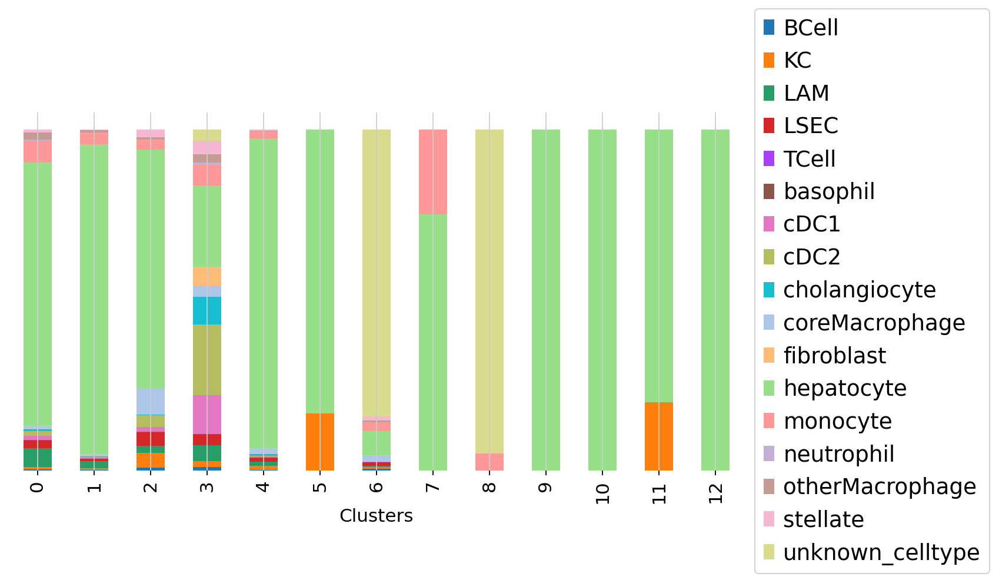

In [ ]:
celltype_column = "annotation"

stacked = (
        sdata.tables[celltype_score_table_layer]
        .obs.groupby(["clusters", celltype_column], as_index=False)
        .size()
        .pivot(index="clusters", columns=celltype_column)
        .fillna(0)
    )
stacked_norm = stacked.div(stacked.sum(axis=1), axis=0)
stacked_norm.columns = list(sdata.tables[celltype_score_table_layer].obs[celltype_column].cat.categories)
fig, ax = plt.subplots(1, 1, figsize=(10, 5))

stacked_norm.plot(kind="bar", stacked=True, ax=fig.gca())
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.get_yaxis().set_ticks([])
plt.xlabel("Clusters")
plt.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize="large")

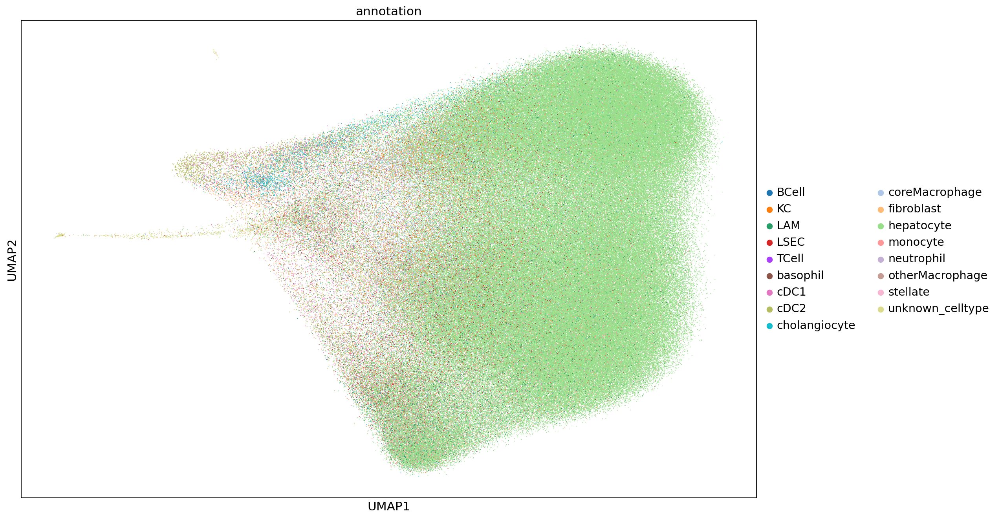

(0.0838791906833648, 14.641345900297164, -7.677250361442566, 6.882714247703552)

In [13]:
# UMAP plot with cells colored by cell type.
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
sc.pl.umap(
    sdata.tables[celltype_score_table_layer],
    color=[celltype_column],
    ax=ax,
    size=3,
)
ax.axis("off")


<Axes: xlabel='Cleanliness', ylabel='annotation'>

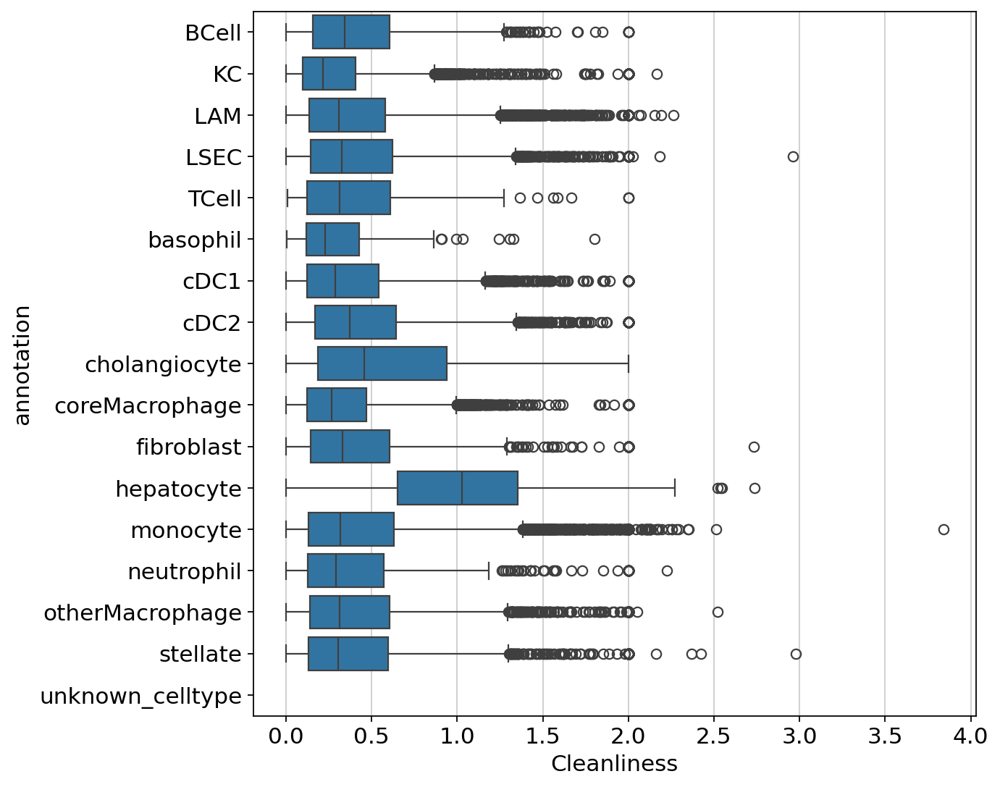

In [14]:
sns.boxplot(y="annotation", x="Cleanliness",
            # Filter data to scores between -25 and 25
            data=sdata[celltype_score_table_layer].obs[(sdata[celltype_score_table_layer].obs["Cleanliness"] < 5) & 
                                        (sdata[celltype_score_table_layer].obs["Cleanliness"] > 0)])
            #data=sdata[celltype_score_table_layer].obs)